In [2]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import plotly.express as px

In [3]:
traffic_accidents = pd.read_csv(r"C:\Users\maria\OneDrive\Desktop\Traffic_Accidents_2_-3219684797739404561.csv")
traffic_accidents.head().T

,0,1,2,3,4
Accident Number,2008473471,2008787228,2009131786,2009418107,20120135824
Date and Time,7/14/2018 11:00:00 PM,11/16/2018 9:33:00 AM,2/19/2019 10:42:00 PM,5/27/2019 9:00:00 PM,3/8/2021 6:05:00 PM
Number of Motor Vehicles,2.0,1.0,1.0,2.0,2.0
Number of Injuries,2.0,1.0,1.0,0.0,1.0
Number of Fatalities,0.0,0.0,0.0,0.0,0.0
Property Damage,NaN,NaN,NaN,NaN,NaN
Hit and Run,N,N,N,Y,N
Collision Type Description,ANGLE,NOT COLLISION W/MOTOR VEHICLE-TRANSPORT,HEAD-ON,REAR END,Front to Rear
Weather Description,NO ADVERSE CONDITIONS,NO ADVERSE CONDITIONS,NO ADVERSE CONDITIONS,NO ADVERSE CONDITIONS,CLEAR
Illumination Description,NaN,NaN,NaN,NaN,DAYLIGHT


In [4]:
print(f"traffic_accidents shape: {traffic_accidents.shape}")
for cols in traffic_accidents:
    print(f"Column: {cols:35} | type:{str(traffic_accidents[cols].dtype):7} | missing_values% {(traffic_accidents[cols].isna().sum() / len(traffic_accidents) * 100)}")

traffic_accidents shape: (230442, 27)
Column: Accident Number                     | type:int64   | missing_values% 0.0
Column: Date and Time                       | type:object  | missing_values% 0.0
Column: Number of Motor Vehicles            | type:float64 | missing_values% 0.0017357946902040427
Column: Number of Injuries                  | type:float64 | missing_values% 0.001301846017653032
Column: Number of Fatalities                | type:float64 | missing_values% 0.001301846017653032
Column: Property Damage                     | type:object  | missing_values% 91.8196335737409
Column: Hit and Run                         | type:object  | missing_values% 0.00607528141571415
Column: Collision Type Description          | type:object  | missing_values% 5.95985106881558
Column: Weather Description                 | type:object  | missing_values% 9.644509247446212
Column: Illumination Description            | type:object  | missing_values% 6.205899966152003
Column: Street Address        

In [5]:
# Dropping columns that are not relevant to the analysis 
traffic = traffic_accidents.copy()
traffic.drop(columns={'Property Damage', 'ObjectId', 'Weather', 'IlluACCIDEmination', 'Collision Type', 'x', 'y'}, inplace=True)
traffic.dropna(subset=['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities', 'Hit and Run', 'Collision Type Description', 'Weather Description', 'Illumination Description', 'Street Address', 'HarmfulDescriptions', 'Reporting Officer', 'City', 'State', 'Precinct'], axis = 0, inplace=True)

In [6]:
# Converting Accident Number into str 
# Spliting Date and Time into seperate columns
traffic['Accident Number'] = traffic['Accident Number'].astype(str)
traffic['Date and Time'] = pd.to_datetime(traffic['Date and Time'])
traffic['Date'] = traffic['Date and Time'].dt.date
traffic['Date'] = pd.to_datetime(traffic['Date'])
traffic['Time'] = traffic['Date and Time'].dt.time
traffic['Day'] = traffic['Date and Time'].dt.day_name()
traffic['Month'] = traffic['Date and Time'].dt.month
traffic['Year'] = traffic['Date and Time'].dt.year

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\4053045528.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  traffic['Date and Time'] = pd.to_datetime(traffic['Date and Time'])


In [7]:
traffic['Hour'] = traffic['Date and Time'].dt.hour
traffic['Hour'] = traffic['Hour'].astype(int)

In [8]:
traffic['Hour'].dtype

dtype('int64')

In [9]:
def time_period(hour):
    if hour > 5 and hour <= 12:
        return "Morning"
    elif hour > 12 and hour <= 17:
        return "Afternoon"
    elif hour > 17 and hour <= 21:
        return "Evening"
    else:
        return "Night"
traffic['Time_Period'] = traffic['Hour'].apply(time_period)
traffic[['Time', 'Hour','Time_Period']].head(5)

,Time,Hour,Time_Period
4,18:05:00,18,Evening
5,15:46:00,15,Afternoon
6,13:00:00,13,Afternoon
8,02:19:00,2,Night
9,23:40:00,23,Night


In [10]:
# Mapping for both Hit and Run column and Month column
Yes_No_mapping = {'N': 'No', 'Y':'Yes'}
Month_mapping = {1:'January', 2:'Febuary', 3:'March', 4:'April', 5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}

traffic['Hit and Run'] = traffic['Hit and Run'].apply(lambda x: Yes_No_mapping[x])
traffic['Month'] = traffic['Month'].apply(lambda x: Month_mapping[x])

In [11]:
traffic.rename(columns={'Collision Type Description': 'Collision Type', 'Weather Description':'Weather', 'Illumination Description':'Illummination', 'HarmfulDescriptions':'Harmful Event'}, inplace = True)


In [12]:
# checking for duplicate values
def columsn_with_duplicates(df, show_examples = False):
     dup_info = {}
     for col in df.columns:
        dup_mask = df[col].duplicated(keep=False)  # Mark all dup instances
        if dup_mask.any():
            unique_count = df[col].nunique()
            total_rows = len(df)
            dup_info[col] = {
                'unique_values': unique_count,
                'duplicate_percentage': (1 - unique_count / total_rows) * 100
            }
            if show_examples:
                examples = df[dup_mask][col].unique()[:5]  # First 5 dup values
                dup_info[col]['example_duplicates'] = examples.tolist()
        return dup_info

info = columsn_with_duplicates(traffic, show_examples=True)
print(info)

{}


In [13]:
# checking the shape of the dataset that is used for the analysis
print(f"The dataset used for analyisis has {traffic.shape[0]} rows and {traffic.shape[1]} columns")

The dataset used for analyisis has 172927 rows and 27 columns


C:\Users\maria\AppData\Local\Temp\ipykernel_45196\1145936452.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  traffic.set_index('Date').resample('M').size().plot(label = "Monthly Accidents", color = 'lightpink', ax = ax)
C:\Users\maria\AppData\Local\Temp\ipykernel_45196\1145936452.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  traffic.set_index('Date').resample('M').size().rolling(window = 12).mean().plot(color = 'darkblue', linewidth = 4, label = '1 year rolling average', ax = ax)


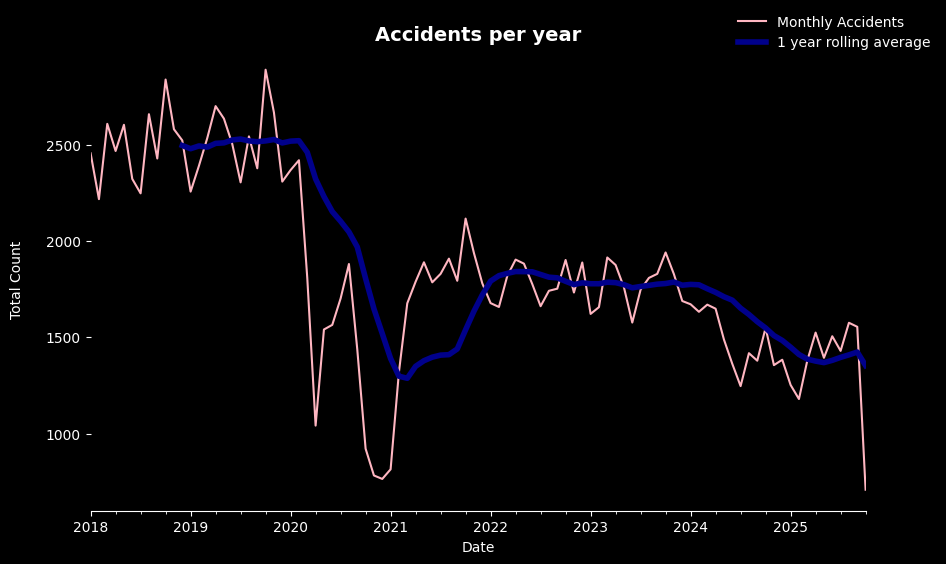

In [14]:
# Accident Trenss over the years 
fig,ax = plt.subplots(figsize=(10,6))
traffic.set_index('Date').resample('M').size().plot(label = "Monthly Accidents", color = 'lightpink', ax = ax)
traffic.set_index('Date').resample('M').size().rolling(window = 12).mean().plot(color = 'darkblue', linewidth = 4, label = '1 year rolling average', ax = ax)
ax.set_title("Accidents per year", fontsize = 14, fontweight = 'bold')
ax.set(ylabel = "Total Count\n")
ax.legend(bbox_to_anchor =(1.1,1.1), frameon = False)
sns.despine(ax = ax, top = True, right = True, left = True, bottom = False)

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\2384867849.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'Year', y = 'Count', data = Yearly_trend, palette ='bone_r', ax = ax)


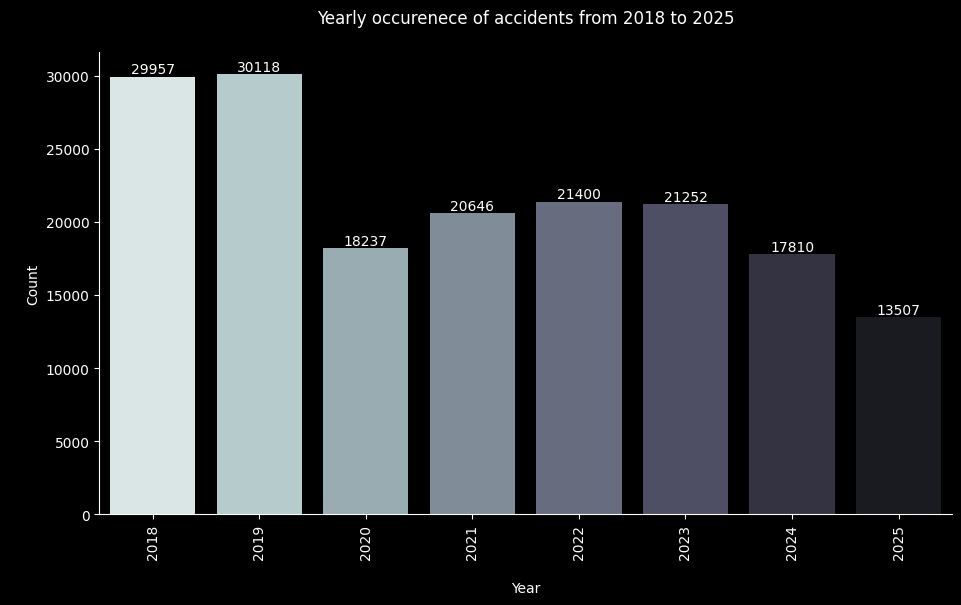

In [15]:
Yearly_trend = traffic.groupby('Year')['Accident Number'].count().reset_index(name='Count')
fig, ax = plt.subplots(figsize = (11,6))
sns.barplot(x = 'Year', y = 'Count', data = Yearly_trend, palette ='bone_r', ax = ax)
ax.set(xlabel='\nYear', ylabel='\nCount')
plt.title('Yearly occurenece of accidents from 2018 to 2025\n')
plt.xticks(rotation = 90)
for bars in ax.containers:
    ax.bar_label(bars)
sns.despine()
plt.show()

In [16]:
# Yearly Statistic
Month_dict = {'January':1, 'Febuary':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 'August':8, 'September':9, 'October':10, 'November':11, 'December':12}

yearly_stats = traffic.groupby(['Year', 'Month']).agg({
    'Number of Motor Vehicles': 'sum',
    'Number of Injuries': 'sum',
    'Number of Fatalities':'sum'
}).sort_values(['Year','Number of Injuries', 'Number of Fatalities'], ascending = [True,False, False])
yearly_stats = yearly_stats.sort_values('Month', key = lambda x: x.apply(lambda x:Month_dict[x]))
styled_yearly_stats = yearly_stats.style.applymap(lambda x: 'background-color: gray' if x > 2500 else '', subset=['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities'])
styled_yearly_stats

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\3561229615.py:10: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_yearly_stats = yearly_stats.style.applymap(lambda x: 'background-color: gray' if x > 2500 else '', subset=['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities'])


,,Number of Motor Vehicles,Number of Injuries,Number of Fatalities
Year,Month,,,
2018,January,4737.000000,777.000000,4.000000
2019,January,4456.000000,765.000000,4.000000
2020,January,4661.000000,846.000000,5.000000
2021,January,1534.000000,301.000000,13.000000
2022,January,8.000000,763.000000,11.000000
2025,January,2421.000000,703.000000,3.000000
2024,January,3156.000000,599.000000,4.000000
2023,January,3123.000000,848.000000,7.000000
2021,Febuary,2456.000000,403.000000,4.000000


In [17]:
# What day and time period do these accidents occur
daily_occurence = traffic.groupby(['Day', 'Time_Period'])['Accident Number'].size().reset_index(name = 'Count')
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_occurence['Day'] = pd.Categorical(daily_occurence['Day'], categories = day_order, ordered=True)
daily_occurence = daily_occurence.sort_values('Day').reset_index(drop = True)
daily_occurence

,Day,Time_Period,Count
0,Monday,Afternoon,5697
1,Monday,Evening,6080
2,Monday,Morning,3978
3,Monday,Night,8555
4,Tuesday,Night,8373
5,Tuesday,Morning,3712
6,Tuesday,Evening,6425
7,Tuesday,Afternoon,6319
8,Wednesday,Night,8939
9,Wednesday,Evening,6525


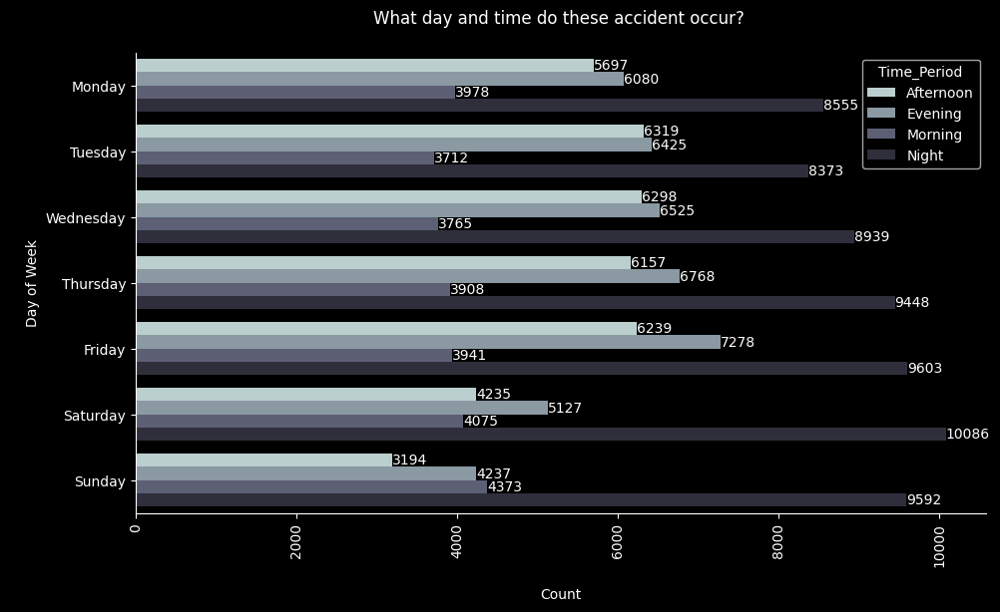

In [18]:
fig, ax = plt.subplots(figsize = (11,6))
sns.barplot(x = 'Count', y = 'Day', hue = 'Time_Period', data = daily_occurence, palette ='bone_r', ax = ax)
ax.set(xlabel='\nCount', ylabel='\nDay of Week')
plt.title('What day and time do these accident occur? \n')
plt.xticks(rotation = 90)
for bars in ax.containers:
    ax.bar_label(bars)
sns.despine()
plt.show()

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\1340197536.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'Collision Type', y = 'Count', data = Collision_types, palette ='bone_r', ax = ax)


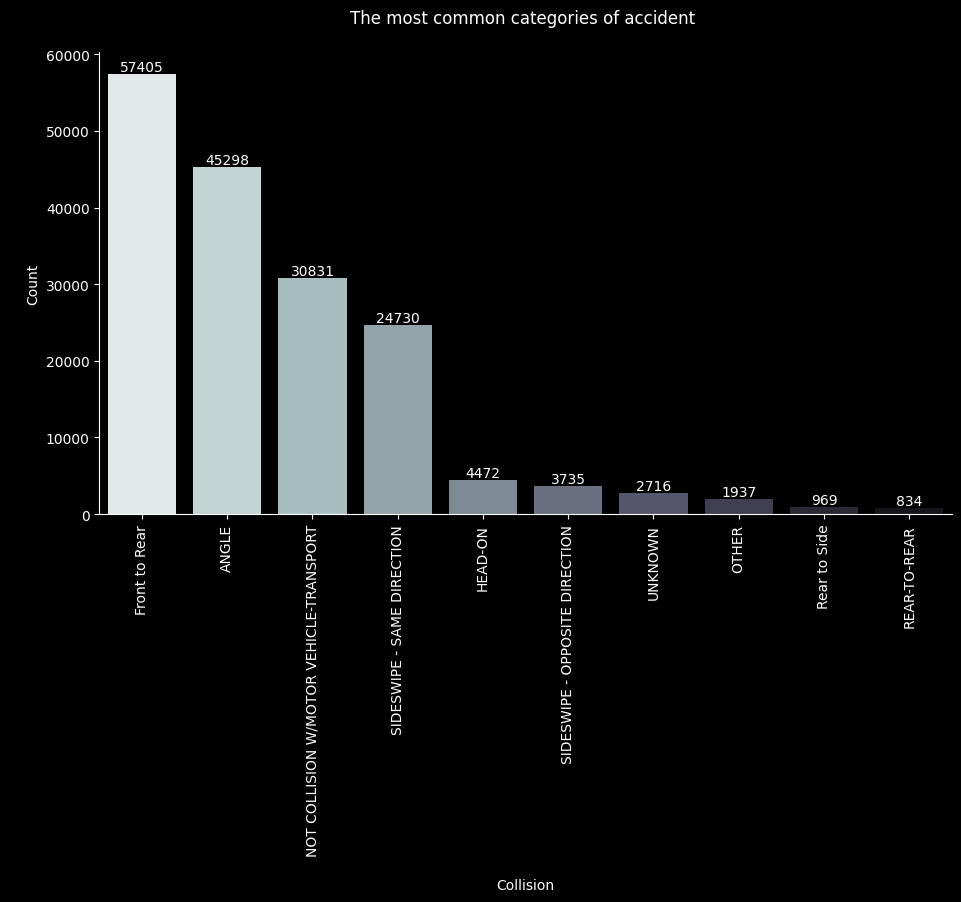

In [19]:
# Common collision types 
Collision_types = traffic.groupby('Collision Type')['Accident Number'].count().reset_index(name = 'Count').sort_values(by = 'Count', ascending=False)
fig, ax = plt.subplots(figsize = (11,6))
sns.barplot(x = 'Collision Type', y = 'Count', data = Collision_types, palette ='bone_r', ax = ax)
ax.set(xlabel='\nCollision', ylabel='\nCount')
plt.title('The most common categories of accident \n')
plt.xticks(rotation = 90)
for bars in ax.containers:
    ax.bar_label(bars)
sns.despine()
plt.show()

In [20]:
# Most common collision types each year
collision_each_year = (traffic.groupby(['Year', 'Collision Type'], as_index = False).size().rename(columns={'size':'No of Reported Accidents'})
)
most_common_collision = (
    collision_each_year.sort_values(['Year', 'No of Reported Accidents'], ascending=[True, False]).drop_duplicates(subset =['Year'], keep = 'first').reset_index(drop = True)

)
most_common_collision

,Year,Collision Type,No of Reported Accidents
0,2018,Front to Rear,11339
1,2019,Front to Rear,11289
2,2020,Front to Rear,5722
3,2021,Front to Rear,6431
4,2022,Front to Rear,6587
5,2023,Front to Rear,6560
6,2024,Front to Rear,5372
7,2025,ANGLE,4139


In [21]:
styled_df = most_common_collision.style.applymap(lambda x: 'background-color: gray' if x > 10000 else '', subset=['No of Reported Accidents'])
styled_df

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\1619426479.py:1: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = most_common_collision.style.applymap(lambda x: 'background-color: gray' if x > 10000 else '', subset=['No of Reported Accidents'])


,Year,Collision Type,No of Reported Accidents
0,2018,Front to Rear,11339
1,2019,Front to Rear,11289
2,2020,Front to Rear,5722
3,2021,Front to Rear,6431
4,2022,Front to Rear,6587
5,2023,Front to Rear,6560
6,2024,Front to Rear,5372
7,2025,ANGLE,4139


C:\Users\maria\AppData\Local\Temp\ipykernel_45196\1780631616.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'Weather', y = 'Count', data = weather_conditions, palette ='bone_r', ax = ax)


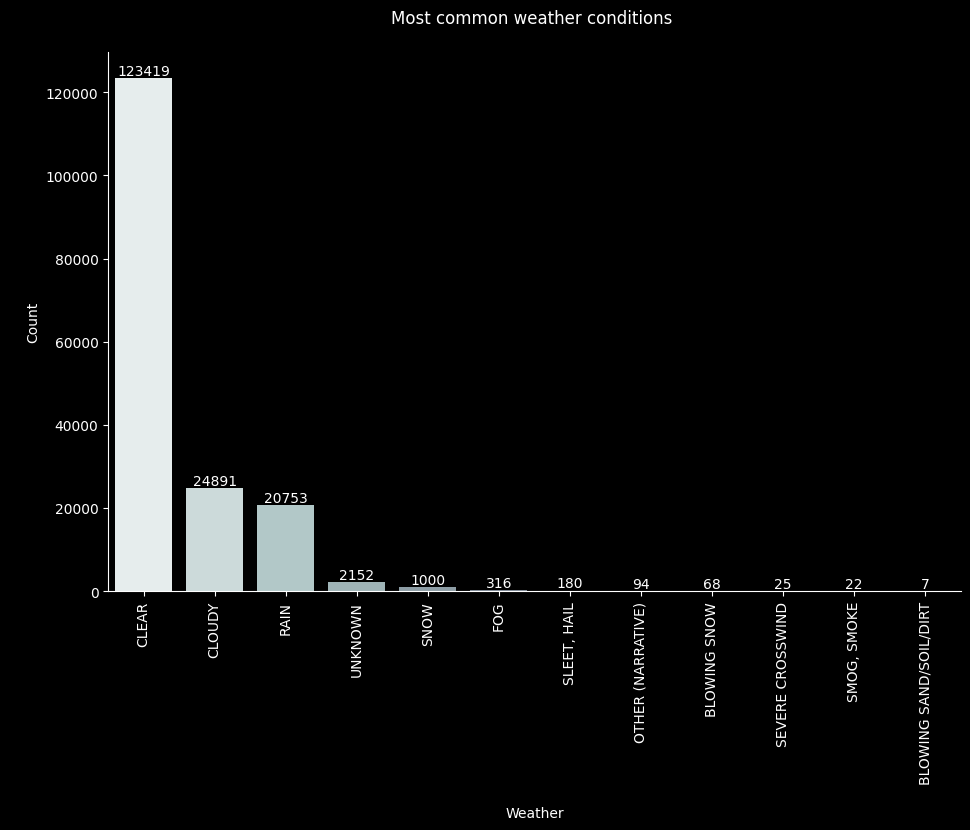

In [22]:
# Most common waether conditions during accidents 
weather_conditions = traffic.groupby('Weather')['Accident Number'].count().reset_index(name = 'Count').sort_values(by = 'Count', ascending = False)
fig, ax = plt.subplots(figsize = (11,7))
sns.barplot(x = 'Weather', y = 'Count', data = weather_conditions, palette ='bone_r', ax = ax)
ax.set(xlabel='\nWeather', ylabel='\nCount')
plt.title('Most common weather conditions \n')
plt.xticks(rotation = 90)
for bars in ax.containers:
    ax.bar_label(bars)
sns.despine()
plt.show()

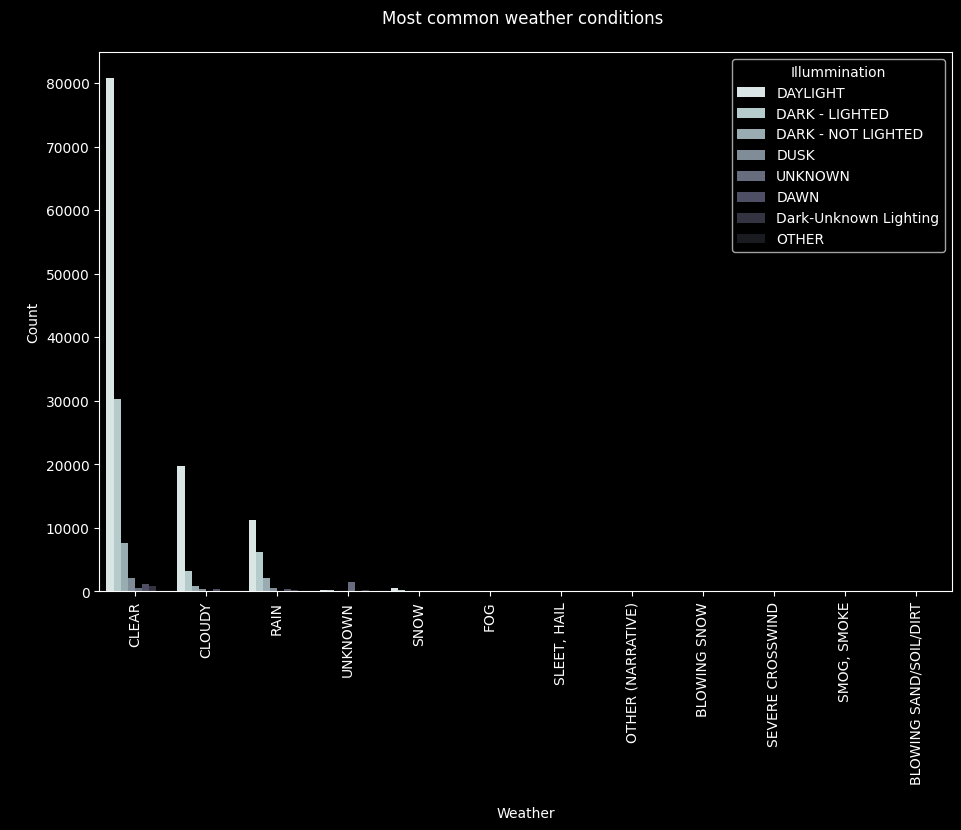

In [23]:
# Weather conditions and illuminations conditions most common in reported accidents
weather_illumination = traffic.groupby(['Weather', 'Illummination'])['Accident Number'].count().reset_index(name = 'Count').sort_values(by = 'Count', ascending=False)
fig, ax = plt.subplots(figsize = (11,7))
sns.barplot(x = 'Weather', y = 'Count',hue = 'Illummination', data = weather_illumination, palette ='bone_r', ax = ax)
ax.set(xlabel='\nWeather', ylabel='\nCount')
plt.title('Most common weather conditions \n')
plt.xticks(rotation = 90)
plt.show()

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\2490581582.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'Precinct', y = 'Count', data = precint_accidents, palette ='bone_r', ax = ax)


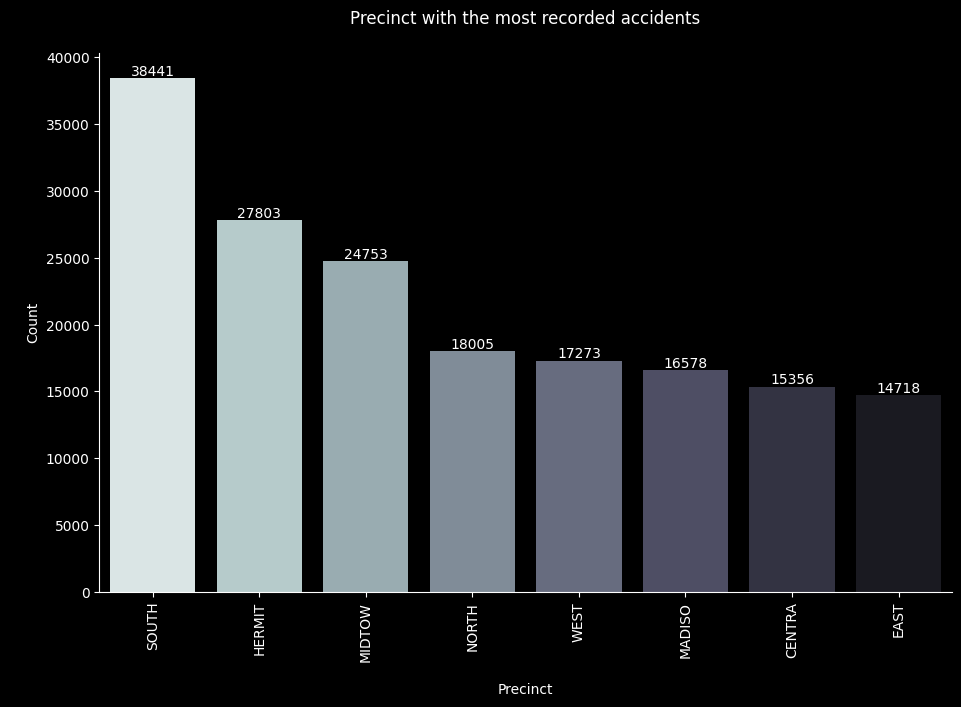

In [24]:
# precinct with most accidents 
precint_accidents = traffic.groupby('Precinct')['Accident Number'].count().reset_index(name='Count').sort_values(by = 'Count', ascending=False)
fig, ax = plt.subplots(figsize = (11,7))
sns.barplot(x = 'Precinct', y = 'Count', data = precint_accidents, palette ='bone_r', ax = ax)
ax.set(xlabel='\nPrecinct', ylabel='\nCount')
plt.title('Precinct with the most recorded accidents\n')
plt.xticks(rotation = 90)
for bars in ax.containers:
    ax.bar_label(bars)
sns.despine()
plt.show()

In [25]:
yearly_precinct_stats = traffic.groupby(['Year', 'Precinct'])[['Number of Motor Vehicles', 'Number of Injuries', 'Number of Fatalities']].sum().reset_index()
styled_yearly_precinct_stats = yearly_precinct_stats.style.applymap(lambda x: 'background-color: gray' if x > 7500 else '', subset=['Number of Motor Vehicles'])
styled_yearly_precinct_stats

C:\Users\maria\AppData\Local\Temp\ipykernel_45196\2874588727.py:2: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_yearly_precinct_stats = yearly_precinct_stats.style.applymap(lambda x: 'background-color: gray' if x > 7500 else '', subset=['Number of Motor Vehicles'])


,Year,Precinct,Number of Motor Vehicles,Number of Injuries,Number of Fatalities
0,2018,CENTRA,5764.000000,894.000000,2.000000
1,2018,EAST,4969.000000,904.000000,3.000000
2,2018,HERMIT,8874.000000,1625.000000,14.000000
3,2018,MADISO,5227.000000,1155.000000,9.000000
4,2018,MIDTOW,10493.000000,1812.000000,7.000000
5,2018,NORTH,5849.000000,1134.000000,9.000000
6,2018,SOUTH,11585.000000,2272.000000,15.000000
7,2018,WEST,5979.000000,1033.000000,10.000000
8,2019,CENTRA,5609.000000,871.000000,7.000000
9,2019,EAST,4908.000000,880.000000,8.000000


In [26]:
summary = []
for year in yearly_precinct_stats['Year'].unique():
    subset = yearly_precinct_stats[yearly_precinct_stats['Year'] == year]
    row = {'Year': year}
    for metric in ['Number of Injuries', 'Number of Fatalities', 'Number of Motor Vehicles']:
        worst = subset.loc[subset[metric].idxmax()]
        row.update({
            f'Worst Precinct ({metric})': worst['Precinct'],
            f'{metric}': int(worst[metric])
        })
    summary.append(row)

final = pd.DataFrame(summary).set_index('Year')

final.style\
  .background_gradient(cmap='OrRd', subset=final.select_dtypes('number').columns)\
  .format('{:,.0f}', subset=final.select_dtypes('number').columns)

,Worst Precinct (Number of Injuries),Number of Injuries,Worst Precinct (Number of Fatalities),Number of Fatalities,Worst Precinct (Number of Motor Vehicles),Number of Motor Vehicles
Year,,,,,,
2018,SOUTH,"2,272",SOUTH,15,SOUTH,"11,585"
2019,SOUTH,"2,591",SOUTH,25,SOUTH,"12,412"
2020,SOUTH,"1,730",HERMIT,18,SOUTH,"7,702"
2021,SOUTH,"2,317",SOUTH,25,SOUTH,"8,330"
2022,SOUTH,"2,671",SOUTH,26,SOUTH,"1,377"
2023,SOUTH,"2,287",SOUTH,31,SOUTH,"9,275"
2024,SOUTH,"2,631",SOUTH,26,SOUTH,"8,679"
2025,SOUTH,"2,253",SOUTH,21,SOUTH,"7,099"


In [27]:
# Most common descriptions from the accidents 
harmful_hit_run = traffic.groupby('Harmful Event').agg({
    'Accident Number': 'count',                    # Count total events per month
    'Hit and Run': lambda x: (x == 'Yes').sum()  # Count only 'Yes' for claimed incidents
}).rename(columns={
    'Accident Number': 'Count',            # Rename for clarity
    'Hit and Run': 'Accidents that were hit and run'        # Rename to reflect count of claimed incidents              # Rename to indicate groups claiming responsibility
}).sort_values(by = 'Count', ascending=False)
harmful_hit_run = harmful_hit_run.head(20)

fig = px.bar(
    data_frame=harmful_hit_run,
    x = harmful_hit_run.index,
    y = ['Count', 'Accidents that were hit and run'],
    opacity=0.8,
    orientation='v',
    barmode='group',
    title = 'Most common harmful descriptions from the accidents and were they hit and run'
)
fig.update_layout(legend = dict(
    title = 'Total Count',
    x = 1,
    y = 1,
    orientation = 'v',
    font = dict(
        family = "Arial",
        size = 12,
        color = "black"

    ),
    bgcolor="lightgray",
        bordercolor="black",
        borderwidth=1
)
)
fig.show()

In [28]:
import geopandas as gpd
from shapely.geometry import Point

geometry = gpd.points_from_xy(traffic['Long'], traffic['Lat'])
gdf = gpd.GeoDataFrame(traffic, geometry=geometry)

fig = px.scatter_map(gdf, lat = gdf.geometry.y,
                        lon = gdf.geometry.x,
                     hover_name="Street Address",
                     zoom=10)
fig.show()